# POLITE — 2026-07-30 rapid dual-beam reduction

This is an unexecuted, data-specific reduction notebook for the no-tracking salvage run. It measures detector behavior in ADU and only derives empirical burst S/N or exploratory double-ratio q/u after a human identifies the same Savart pair in every required frame.

**As acquired:** 37 light frames at 0.1 s, gain 140, Mode 5, offset 20; five-frame bursts in fields 1–4 and 6; complete HWP cycles in fields 1 and 5; 20 biases; ten 0.1-s darks; and two each of 30/120/300-s darks. `probe.fits` is gain 100, 2×2, and is excluded.

## Scope and hard limits

ESTABLISHED: the 0.1-s darks, biases, and light frames match Mode 5/gain 140/offset 20. The first five science fields use a 5252×4176 crop while calibrations and field 6 use 6252×4176. FITS headers omit ROI origins, so `capture_manifest.csv` is the authoritative ROI mapping.

OPEN: e⁻/ADU, read noise in e⁻, full well, QE, and a calibrated theoretical S/N are not measured at gain 140. Do not use a gain value from another run. No flats were acquired.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import csv, os, sys
from collections import defaultdict
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import mad_std
from photutils.aperture import ApertureStats, CircularAnnulus, CircularAperture

root = Path.cwd().resolve()
while not (root / 'pyproject.toml').exists() and root.parent != root: root = root.parent
if not (root / 'pyproject.toml').exists(): raise RuntimeError('Could not locate POLITE root')
os.chdir(root)
if str(root) not in sys.path: sys.path.insert(0, str(root))
import caltools as ct
import poltools as pt
from poltools import BeamFlux
from poltools.modulation import double_ratio
plt.rcParams['figure.dpi'] = 110


In [3]:
DATA = Path('FITSDATA/20260730')
MANIFEST = DATA / 'capture_manifest.csv'
with MANIFEST.open(newline='') as f: frames = list(csv.DictReader(f))
for frame in frames: frame['path'] = DATA / frame['filename']
assert len(frames) == 72, len(frames)
assert all(fits.getheader(frame['path'])['GAIN'] == 140 for frame in frames)
assert all(fits.getheader(frame['path'])['READMODE'] == 5 for frame in frames)
groups = defaultdict(list)
for frame in frames: groups[(frame['imagetyp'], float(frame['exptime_s']), frame['block'])].append(frame)
for key, rs in sorted(groups.items()): print(key, len(rs), fits.getheader(rs[0]['path'])['NAXIS1'], 'x', fits.getheader(rs[0]['path'])['NAXIS2'])


('BIAS', 0.0, 'bias20') 20 6252 x 4176
('DARK', 0.1, 'dark_science') 10 6252 x 4176
('DARK', 30.0, 'dark_30s') 2 6252 x 4176
('DARK', 120.0, 'dark_120s') 2 6252 x 4176
('DARK', 300.0, 'dark_300s') 2 6252 x 4176
('LIGHT', 0.1, 'field_acquisition') 3 5252 x 4176
('LIGHT', 0.1, 'optional_same_pair_cycle') 8 5252 x 4176
('LIGHT', 0.1, 'same_pair_burst_1') 5 5252 x 4176
('LIGHT', 0.1, 'same_pair_burst_2') 5 5252 x 4176
('LIGHT', 0.1, 'same_pair_burst_3') 5 5252 x 4176
('LIGHT', 0.1, 'same_pair_burst_4') 5 5252 x 4176
('LIGHT', 0.1, 'same_pair_burst_6') 5 6252 x 4176


## Calibration products

The chunked `caltools` calls avoid a multi-gigabyte full-frame cube. The 0.1-s master dark is bias-subtracted; science correction therefore subtracts `master_bias + master_dark_01`. Long darks are used for a hot-pixel mask and dark-rate trend, not scaled into 0.1-s science frames.

In [4]:
bias_paths = [str(frame['path']) for frame in frames if frame['imagetyp'] == 'BIAS']
dark_paths = {t: [str(frame['path']) for frame in frames if frame['imagetyp'] == 'DARK' and float(frame['exptime_s']) == t] for t in (0.1, 30.0, 120.0, 300.0)}
master_bias = ct.master_bias(bias_paths, method='median', chunk_rows=32)
rn_adu, temporal_adu = ct.read_noise_map_from_paths(bias_paths, chunk_rows=32)
master_dark_01 = ct.master_dark(dark_paths[0.1], master_bias, method='median', chunk_rows=32)
master_dark_long = {t: ct.master_dark(dark_paths[t], master_bias, method='median', chunk_rows=32) for t in (30.0, 120.0, 300.0)}

# hot mask 8 mad std above median of 300s dark or read-noise map
hot_mask = master_dark_long[300.0] > np.nanmedian(master_dark_long[300.0]) + 8 * mad_std(master_dark_long[300.0])
hot_mask |= rn_adu > np.nanmedian(rn_adu) + 8 * mad_std(rn_adu)

print(f'bias median {np.median(master_bias):.1f} ADU | read-noise median {np.median(rn_adu):.2f} ADU | masked {hot_mask.mean():.3%}')


bias median 1998.0 ADU | read-noise median 685.15 ADU | masked 3.272%


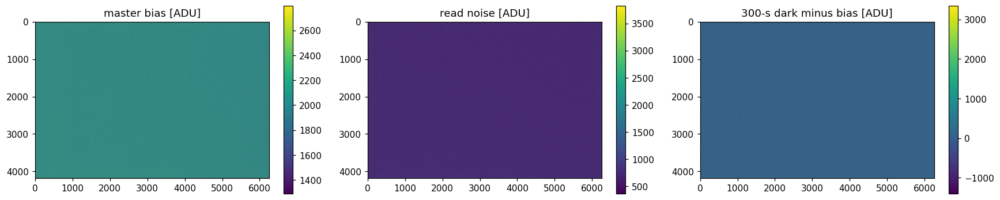

In [5]:
fig, ax = plt.subplots(1, 3, figsize=(16, 4))
for a, image, title in zip(ax, (master_bias, rn_adu, master_dark_long[300.0]), ('master bias [ADU]', 'read noise [ADU]', '300-s dark minus bias [ADU]')):
    lo, hi = np.nanpercentile(image, (1, 99)); im = a.imshow(image, origin='upper', cmap='viridis', vmin=lo, vmax=hi)
    a.set_title(title); fig.colorbar(im, ax=a, shrink=.8)
plt.tight_layout()


dark slope: 0.14768862043108255 ADU/pixel/s (gain-140 detector-unit result only)


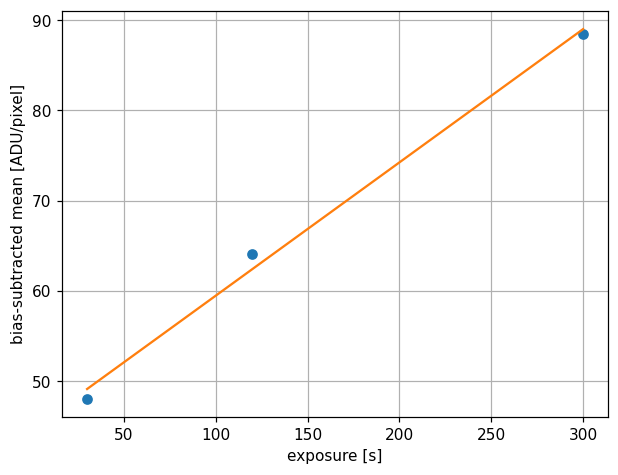

In [6]:
valid = ~hot_mask
levels = []
for exposure_s in (30.0, 120.0, 300.0):
    means = [np.mean((ct.load_frame(p) - master_bias)[valid]) for p in dark_paths[exposure_s]]
    levels.append((exposure_s, np.mean(means), np.std(means, ddof=1)))
x = np.array([v[0] for v in levels]); y = np.array([v[1] for v in levels])
slope, intercept = np.polyfit(x, y, 1)
print('dark slope:', slope, 'ADU/pixel/s (gain-140 detector-unit result only)')
plt.plot(x, y, 'o'); plt.plot(x, slope*x + intercept); plt.xlabel('exposure [s]'); plt.ylabel('bias-subtracted mean [ADU/pixel]'); plt.grid()


## Bias/dark-subtracted science frames and pair proposals

Inspect the automatically proposed A/B pair on each field's first bias/dark-subtracted frame. This dataset contains many warm/noisy pixels and no prior measured beam geometry, so pair tracking is reviewed before photometry. Coordinates are local to each raw camera frame.

In [7]:
FULL_STARTX = 24
def master_calibration_roi(frame):
    startx, numx = int(frame['startx']), int(frame['numx'])
    x0 = startx - FULL_STARTX
    return (slice(None), slice(x0, x0 + numx))

def load_bias_dark_subtracted(frame):
    data = ct.load_frame(str(frame['path']))
    calibration_roi = master_calibration_roi(frame)
    calibrated_data = ct.subtract_bias_and_dark(
        data, master_bias[calibration_roi], master_dark_01[calibration_roi],
    )
    return calibrated_data, hot_mask[calibration_roi]

def show_frame(frame):
    data, bad_pixel_mask = load_bias_dark_subtracted(frame)
    good = np.isfinite(data) & ~bad_pixel_mask
    lo, hi = np.nanpercentile(data[good], (10., 99.))
    plt.figure(figsize=(12, 8)); plt.imshow(data, origin='upper', cmap='gray', vmin=lo, vmax=hi)
    plt.title(frame['filename']); plt.colorbar(label='bias/dark-subtracted ADU')

field_last = {frame['target']: frame for frame in frames if frame['imagetyp'] == 'LIGHT' and frame['block'] not in ['field_acquisition', 'optional_same_pair_cycle']}
field_bursts = {(frame['target'], frame['cycle']): frame for frame in frames if frame['imagetyp'] == 'LIGHT' and frame['block'] not in ['field_acquisition', 'optional_same_pair_cycle']}

same_pair_burst_6


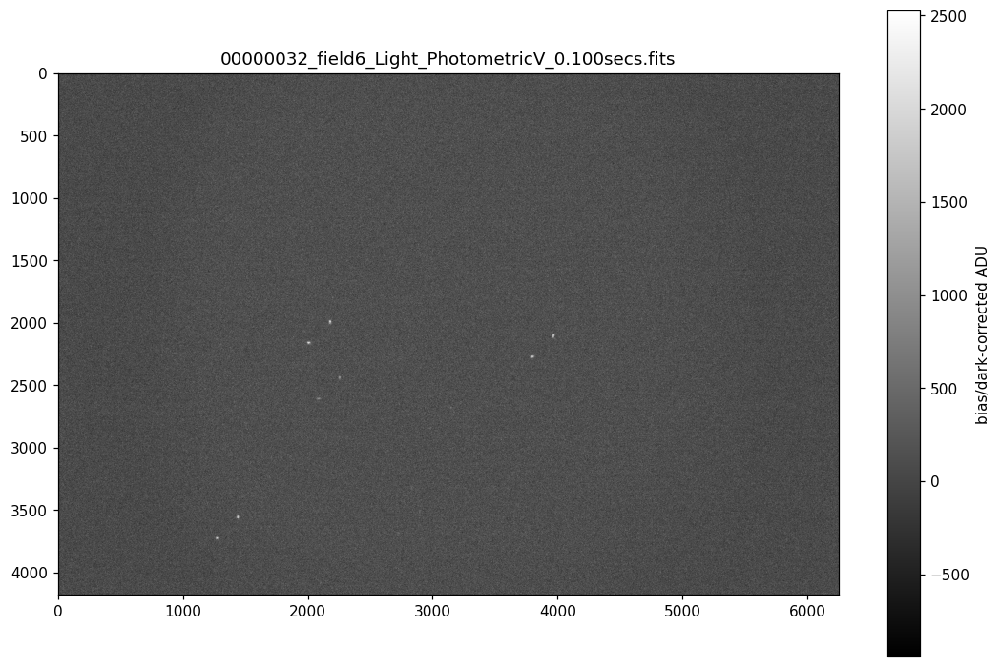

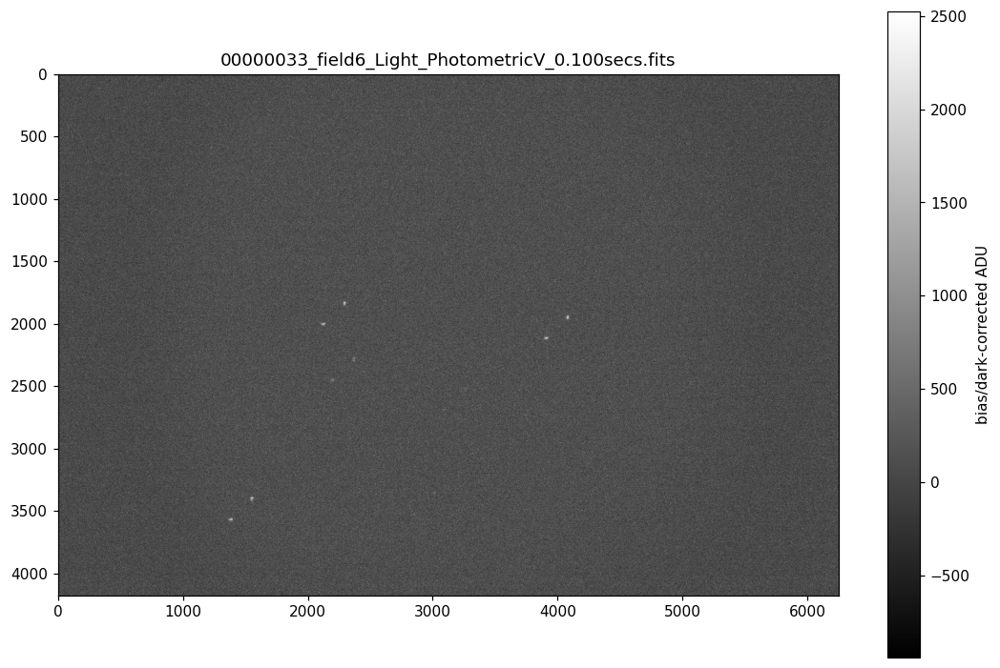

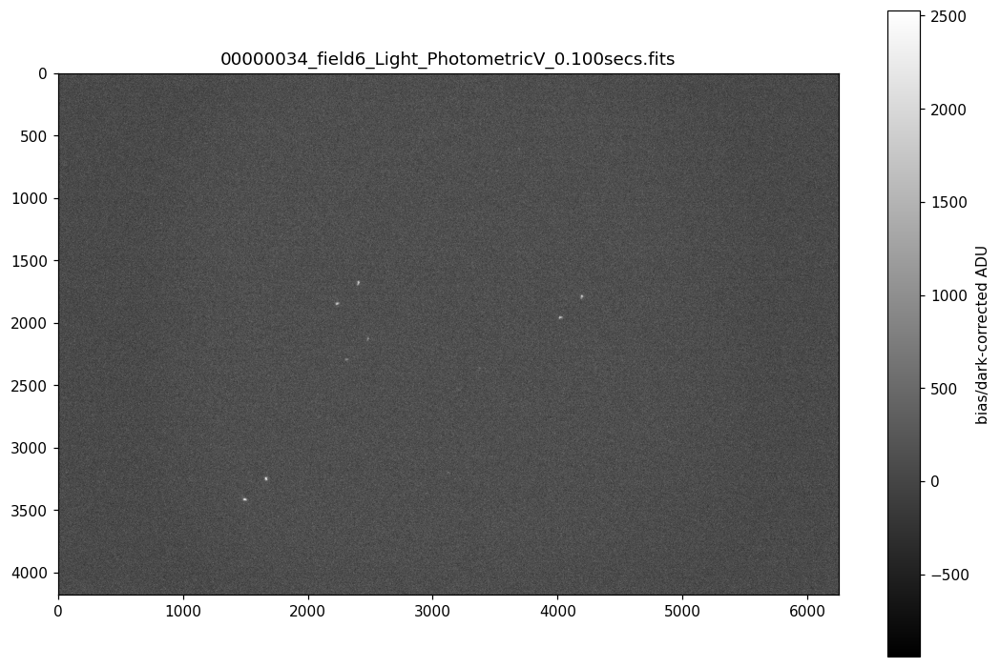

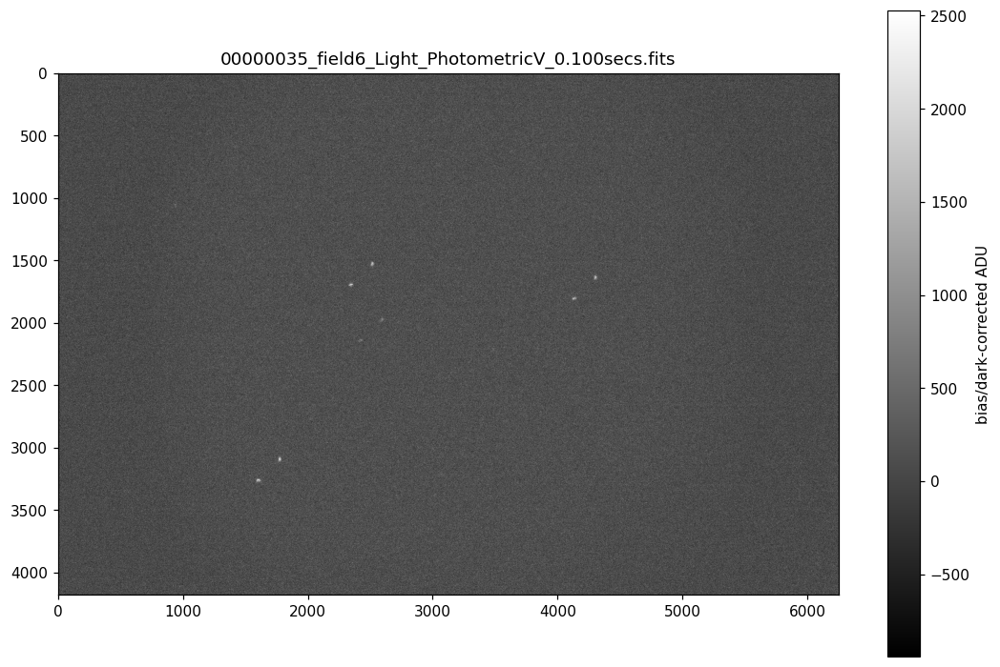

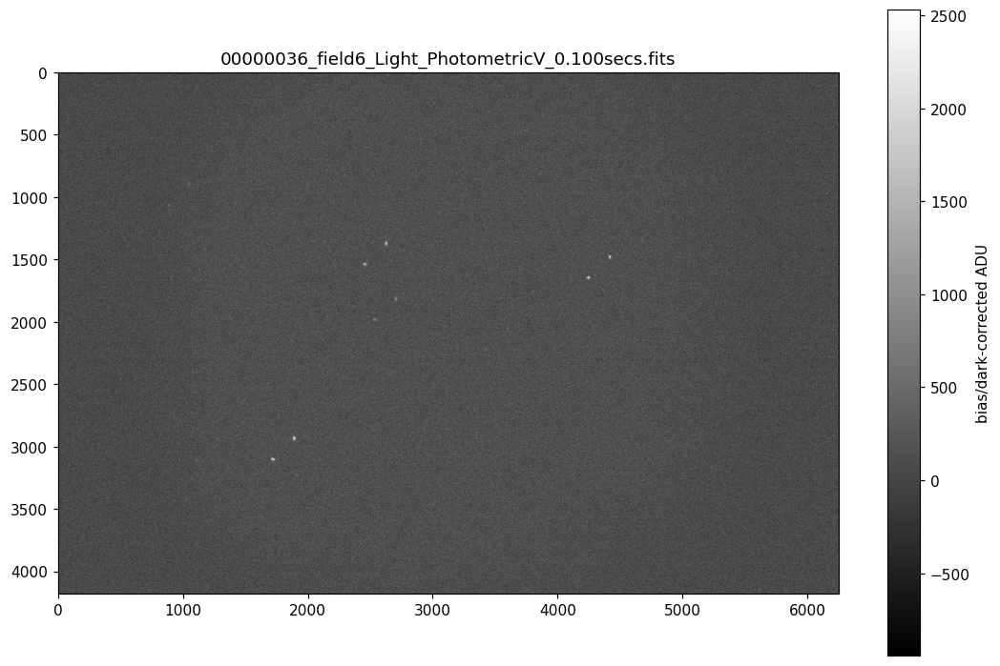

In [8]:
selected_field = 'field_6'
print(f"{field_bursts[(selected_field, '0')]['block']}")
for i in range(5):
    show_frame(field_bursts[(selected_field, str(i))])

In [9]:
# Automatic pair tracking is fail-closed: do not relax these tolerances
# without inspecting the per-frame overlays below.
TRACK_TRANSLATION_TOLERANCE_PX = 12.0
TRACK_MATCH_TOLERANCE_PX = 15.0

In [10]:
STARTING_PAIR_PREVIEWS = {}
for field in ['field_1', 'field_2', 'field_3', 'field_4', 'field_6']:
    first_frame = field_bursts[(field, '0')]
    data, bad_pixel_mask = load_bias_dark_subtracted(first_frame)
    proposal = pt.propose_anchor_pair(data, bad_pixel_mask=bad_pixel_mask)

    STARTING_PAIR_PREVIEWS[field] = proposal
{field: proposal.as_pair_anchors() for field, proposal in STARTING_PAIR_PREVIEWS.items()}

{'field_1': {'o': (2600.22471859114, 1029.9510383016552),
  'e': (2429.254478980221, 1197.7893862850751)},
 'field_2': {'o': (704.3470698939456, 1104.273328142473),
  'e': (537.6831001074341, 1270.5576121919255)},
 'field_3': {'o': (4007.375943687371, 3149.6679266029055),
  'e': (3837.512896693823, 3318.1286022167487)},
 'field_4': {'o': (2969.3226040120667, 974.9189280551683),
  'e': (2799.541605352936, 1142.4538018912124)},
 'field_6': {'o': (2174.635685664278, 1989.3821897067044),
  'e': (2004.3778753474837, 2157.246351095061)}}

beam: BeamGeometry(separation_px=238.52362871831147, position_angle_deg=314.61848350141963),
anchors: {'o': (2969.3226040120667, 974.9189280551683), 'e': (2799.541605352936, 1142.4538018912124)}


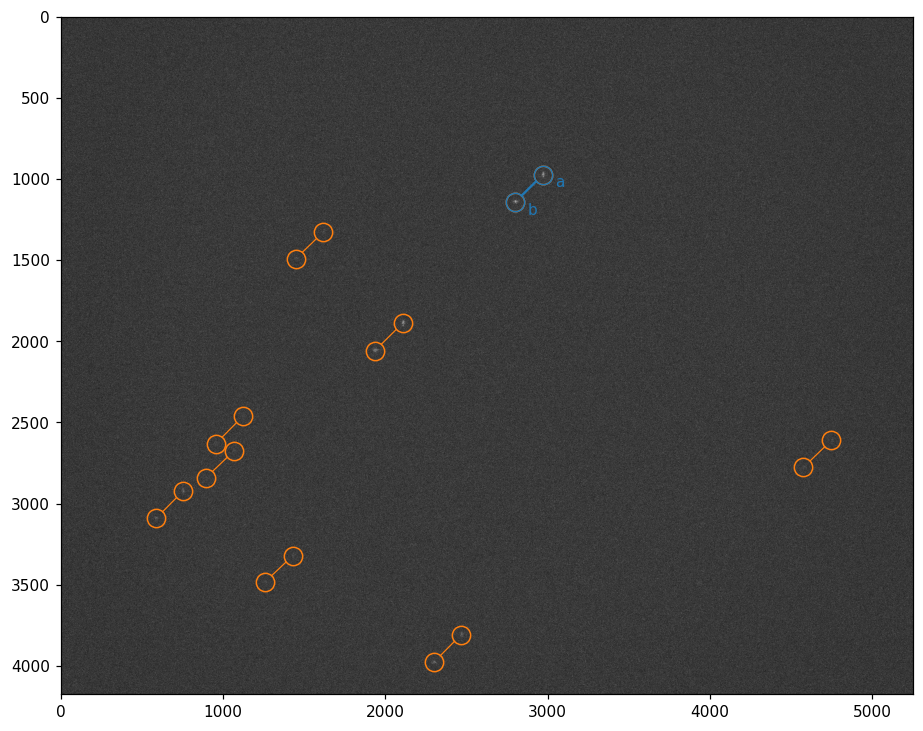

In [11]:
first_frame = field_bursts[('field_4', '0')]
data, bad_pixel_mask = load_bias_dark_subtracted(first_frame)
proposal = pt.propose_anchor_pair(data, bad_pixel_mask=bad_pixel_mask)

anchors = proposal.as_pair_anchors()
beam = proposal.beam_geometry
print(f"beam: {beam},\nanchors: {anchors}")

display_data = data.copy()
good = np.isfinite(data) & ~bad_pixel_mask
display_data[~good] = np.median(data[good])

fig, ax = plt.subplots(figsize=(12, 8))
lo, hi = np.nanpercentile(display_data[good], (5, 99.8))
ax.imshow(display_data, origin='upper', cmap='gray', vmin=lo, vmax=hi)
proposal.overlay(ax)
plt.show()

In [12]:
# Fill only after inspection.
# e.g. ('same_pair_burst_1', 'same_pair_burst_4'); only include visually verified fields
BURST_BLOCKS_TO_REDUCE = ('same_pair_burst_1', 'same_pair_burst_2', 
                          'same_pair_burst_3', 'same_pair_burst_4',
                          'same_pair_burst_6')


## Burst photometry and empirical S/N

Each frame is re-detected, then all matched Savart pairs vote for the adjacent-frame detector translation. The first two frames select a pair with a supported continuation, favoring the next frame's brightest valid pair so an edge-bound default is not used. Later frames use the pair nearest the predicted location; a missing common translation or a poor predicted match stops the reduction. Inspect the per-frame overlays before interpreting fluxes. Aperture radii are deliberately retained in the long-form CSV; choose the final aperture only after inspecting the S/N-versus-radius curve.

In [13]:
AP_RADII, ANNULUS = (4, 6, 8, 10), (14, 20)
def track_0730_frames(frame_sequence):
    """Track this drifting sequence, selecting a first pair that survives frame 2.

    This first-two-frame recovery is specific to 2026-07-30: the default
    brightest pair can leave the detector edge. Normal sequences use
    pt.track_pair_sequence instead.
    """
    frame_sequence = list(frame_sequence)
    if not frame_sequence: raise ValueError('Cannot track an empty frame sequence')
    first_frame = frame_sequence[0]
    first_data, first_mask = load_bias_dark_subtracted(first_frame)
    first_proposal = pt.propose_anchor_pair(first_data, bad_pixel_mask=first_mask)
    if len(frame_sequence) == 1:
        return (pt.TrackedPairFrame(first_frame, first_proposal.beam_a_xy, first_proposal.beam_b_xy, None, None),)
    second_frame = frame_sequence[1]
    second_data, second_mask = load_bias_dark_subtracted(second_frame)
    second_proposal = pt.propose_anchor_pair(second_data, bad_pixel_mask=second_mask)
    try:
        first_pair, pair, shift_xy, prediction_rms_px = pt.select_trackable_pair(
            first_proposal.matched_pairs, second_proposal.matched_pairs,
            (second_proposal.beam_a_xy, second_proposal.beam_b_xy),
            translation_tolerance_px=TRACK_TRANSLATION_TOLERANCE_PX,
            match_tolerance_px=TRACK_MATCH_TOLERANCE_PX,
        )
    except ValueError as exc:
        raise RuntimeError(f'{second_frame["filename"]}: could not initialize a tracked pair: {exc}') from exc
    tracks = [
        pt.TrackedPairFrame(first_frame, first_pair[0], first_pair[1], None, None),
        pt.TrackedPairFrame(second_frame, pair[0], pair[1], shift_xy, prediction_rms_px),
    ]
    previous_matches = second_proposal.matched_pairs
    for frame in frame_sequence[2:]:
        data, bad_pixel_mask = load_bias_dark_subtracted(frame)
        proposal = pt.propose_anchor_pair(data, bad_pixel_mask=bad_pixel_mask)
        try:
            pair, shift_xy, prediction_rms_px = pt.track_matched_pair(
                pair, previous_matches, proposal.matched_pairs,
                translation_tolerance_px=TRACK_TRANSLATION_TOLERANCE_PX,
                match_tolerance_px=TRACK_MATCH_TOLERANCE_PX,
            )
        except ValueError as exc:
            raise RuntimeError(f'{frame["filename"]}: pair tracking failed: {exc}') from exc
        tracks.append(pt.TrackedPairFrame(frame, pair[0], pair[1], shift_xy, prediction_rms_px))
        previous_matches = proposal.matched_pairs
    return tuple(tracks)

def aperture_row(data, xy, radius, frame, beam):
    aper, ann = CircularAperture(xy, r=radius), CircularAnnulus(xy, r_in=ANNULUS[0], r_out=ANNULUS[1])
    ap_sum = float(ApertureStats(data, aper).sum); sky = float(ApertureStats(data, ann).median)
    net = ap_sum - sky * aper.area; peak = float(np.nanmax(aper.to_mask(method='center').multiply(data, fill_value=np.nan)))
    return {'filename': frame['filename'], 'block': frame['block'], 'target': frame['target'], 'hwp_deg': float(frame['hwp_achieved_deg']), 'beam': beam, 'x': xy[0], 'y': xy[1], 'aperture_radius_px': radius, 'annulus_rin_px': ANNULUS[0], 'annulus_rout_px': ANNULUS[1], 'aperture_sum_adu': ap_sum, 'sky_adu_per_px': sky, 'net_source_adu': net, 'peak_adu': peak, 'saturated': peak >= 65535}


In [14]:
burst_blocks = set(BURST_BLOCKS_TO_REDUCE)
assert burst_blocks, 'Select only visually verified burst blocks.'
rows = []
BURST_TRACKS = {}
for block in sorted(burst_blocks):
    burst = sorted([frame for frame in frames if frame['block'] == block], key=lambda frame: frame['filename'])
    if len(burst) != 5: print('SKIP', block, 'expected 5 frames, got', len(burst)); continue
    tracks = track_0730_frames(burst)
    BURST_TRACKS[block] = tracks
    for tracked in tracks:
        frame = tracked.frame
        data, _bad_pixel_mask = load_bias_dark_subtracted(frame)
        anchors = {'a': tracked.beam_a_xy, 'b': tracked.beam_b_xy}
        for radius in AP_RADII:
            rows += [aperture_row(data, anchors['a'], radius, frame, 'a'), aperture_row(data, anchors['b'], radius, frame, 'b')]
assert rows, 'Automatic pair tracking produced no aperture rows.'
out = DATA / 'aperture_measurements.csv'
with out.open('w', newline='') as f: writer = csv.DictWriter(f, fieldnames=rows[0].keys()); writer.writeheader(); writer.writerows(rows)
for block in sorted({r['block'] for r in rows}):
    for beam in ('a', 'b'):
        vals = np.array([r['net_source_adu'] for r in rows if r['block'] == block and r['beam'] == beam and r['aperture_radius_px'] == 8])
        print(block, beam, 'n=', len(vals), 'mean/std empirical S/N=', vals.mean()/vals.std(ddof=1))
for block, tracks in BURST_TRACKS.items():
    for tracked in tracks:
        if tracked.shift_xy is not None:
            print(tracked.frame['filename'], 'shift=', tracked.shift_xy, 'prediction RMS=', tracked.prediction_rms_px)


same_pair_burst_1 ordinary n= 5 mean/std empirical S/N= 7.309391742710943
same_pair_burst_1 extraordinary n= 5 mean/std empirical S/N= 6.354193416385124
same_pair_burst_2 ordinary n= 5 mean/std empirical S/N= 9.382271312799357
same_pair_burst_2 extraordinary n= 5 mean/std empirical S/N= 7.799909840477907
same_pair_burst_3 ordinary n= 5 mean/std empirical S/N= 3.8712826328773717
same_pair_burst_3 extraordinary n= 5 mean/std empirical S/N= 3.149987338150381
same_pair_burst_4 ordinary n= 5 mean/std empirical S/N= 8.073659082912119
same_pair_burst_4 extraordinary n= 5 mean/std empirical S/N= 5.2357043416427835
same_pair_burst_6 ordinary n= 5 mean/std empirical S/N= 6.5131871066301175
same_pair_burst_6 extraordinary n= 5 mean/std empirical S/N= 4.345013622698666
00000005_field1_Light_PhotometricV_0.100secs.fits shift= (164.0042953049233, -223.8542999795714) prediction RMS= 1.4037081703958845
00000006_field1_Light_PhotometricV_0.100secs.fits shift= (164.7330235958482, -218.06977515605698) pr

In [ ]:
# Review a completed track. The package owns the green-ring overlay.
# pt.show_tracked_sequence(BURST_TRACKS['same_pair_burst_1'], load_data=load_bias_dark_subtracted, half_size_px=750)


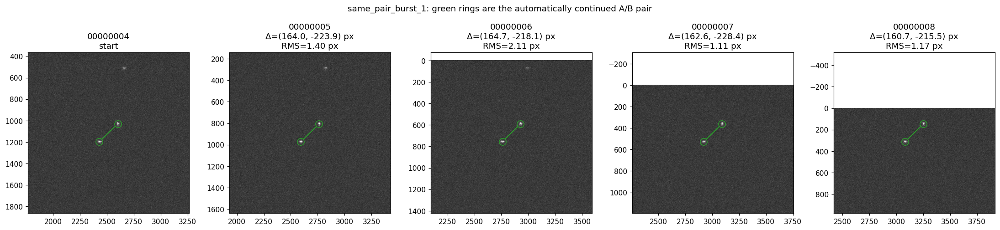

In [32]:
pt.show_tracked_sequence(BURST_TRACKS['same_pair_burst_1'], load_data=load_bias_dark_subtracted, half_size_px=750);

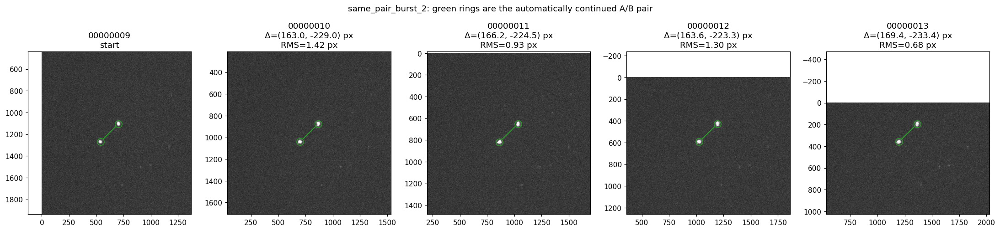

In [33]:
pt.show_tracked_sequence(BURST_TRACKS['same_pair_burst_2'], load_data=load_bias_dark_subtracted, half_size_px=750);

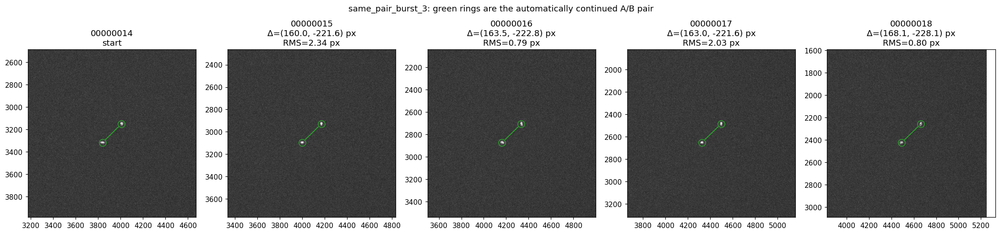

In [34]:
pt.show_tracked_sequence(BURST_TRACKS['same_pair_burst_3'], load_data=load_bias_dark_subtracted, half_size_px=750);

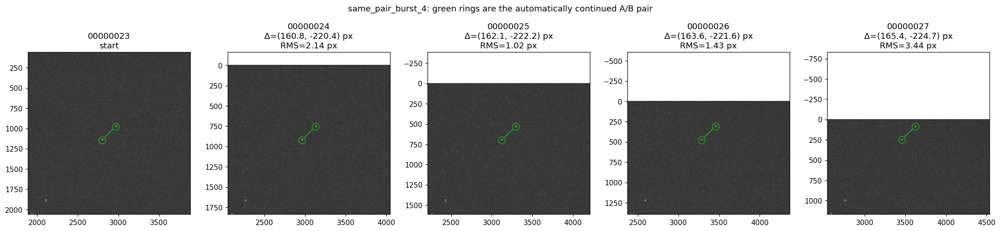

In [39]:
pt.show_tracked_sequence(BURST_TRACKS['same_pair_burst_4'], load_data=load_bias_dark_subtracted, half_size_px=1000);

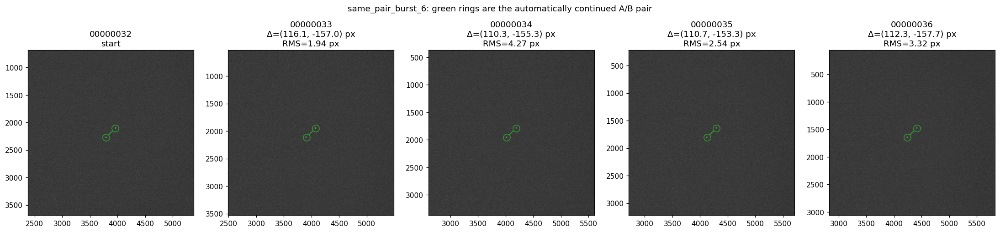

In [38]:
pt.show_tracked_sequence(BURST_TRACKS['same_pair_burst_6'], load_data=load_bias_dark_subtracted, half_size_px=1000);

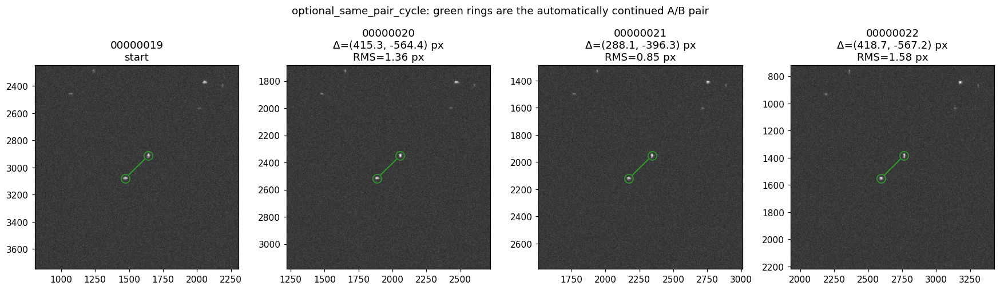

In [30]:
field_1_frames = sorted([frame for frame in frames if frame['block'] == 'optional_same_pair_cycle' and frame['target'] == 'field_1'], key=lambda frame: frame['filename'])
pt.show_tracked_sequence(track_0730_frames(field_1_frames), load_data=load_bias_dark_subtracted, half_size_px=750);

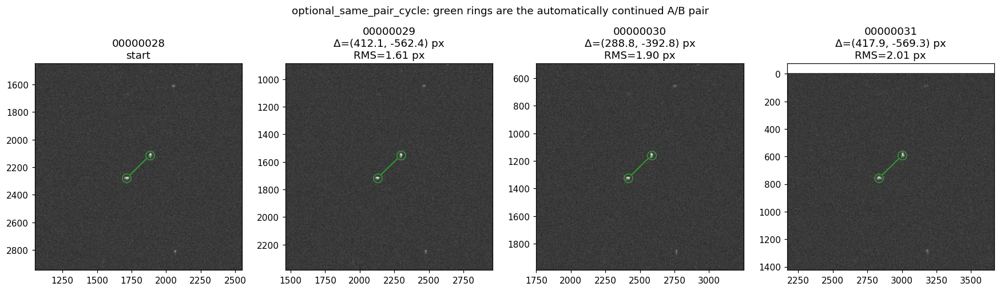

In [31]:
field_5_frames = sorted([frame for frame in frames if frame['block'] == 'optional_same_pair_cycle' and frame['target'] == 'field_5'], key=lambda frame: frame['filename'])
pt.show_tracked_sequence(track_0730_frames(field_5_frames), load_data=load_bias_dark_subtracted, half_size_px=750);

## HWP cycles: exploratory double ratio

Fields 1 and 5 each contain a complete cycle. Track each cycle in capture order, then let the recorded HWP angles enter the double ratio. Reduce a cycle only if the automatic track remains visually correct at all four angles and both apertures avoid saturation. The q/u estimate is flat-field-independent, but its uncertainty remains OPEN until gain-140 electron-noise terms are characterized.

In [17]:
cycle_frames_by_angle = {(frame['target'], frame['hwp_achieved_deg']): frame for frame in frames if frame['imagetyp'] == 'LIGHT' and frame['block'] == 'optional_same_pair_cycle'}
cycle_frames_by_angle

{('field_1',
  '0.0'): {'filename': '00000019_field1_Light_PhotometricV_0.100secs.fits', 'block': 'optional_same_pair_cycle', 'target': 'field_1', 'imagetyp': 'LIGHT', 'exptime_s': '0.1', 'hwp_requested_deg': '0.0', 'hwp_achieved_deg': '0.0', 'instrot_deg': '', 'cycle': '1', 'focus_label': 'selected', 'startx': '524', 'starty': '0', 'numx': '5252', 'numy': '4176', 'path': PosixPath('FITSDATA/20260730/00000019_field1_Light_PhotometricV_0.100secs.fits')},
 ('field_1',
  '45.0'): {'filename': '00000020_field1_Light_PhotometricV_0.100secs.fits', 'block': 'optional_same_pair_cycle', 'target': 'field_1', 'imagetyp': 'LIGHT', 'exptime_s': '0.1', 'hwp_requested_deg': '45.0', 'hwp_achieved_deg': '45.0', 'instrot_deg': '', 'cycle': '1', 'focus_label': 'selected', 'startx': '524', 'starty': '0', 'numx': '5252', 'numy': '4176', 'path': PosixPath('FITSDATA/20260730/00000020_field1_Light_PhotometricV_0.100secs.fits')},
 ('field_1',
  '22.5'): {'filename': '00000021_field1_Light_PhotometricV_0.100sec

In [18]:
def exploratory_cycle(target, radius=8):
    cycle_frames = sorted([frame for frame in frames if frame['block'] == 'optional_same_pair_cycle' and frame['target'] == target], key=lambda frame: frame['filename'])
    assert {float(frame['hwp_achieved_deg']) for frame in cycle_frames} == {0.0, 22.5, 45.0, 67.5}
    tracks = track_0730_frames(cycle_frames)
    fluxes = []
    for tracked in tracks:
        frame = tracked.frame
        data, _bad_pixel_mask = load_bias_dark_subtracted(frame)
        beam_a = aperture_row(data, tracked.beam_a_xy, radius, frame, 'a')
        beam_b = aperture_row(data, tracked.beam_b_xy, radius, frame, 'b')
        if beam_a['saturated'] or beam_b['saturated']: raise RuntimeError(f"{frame['filename']}: saturated aperture; reject full cycle")
        fluxes.append(BeamFlux(hwp_deg=float(frame['hwp_achieved_deg']), f_o=beam_a['net_source_adu'], f_e=beam_b['net_source_adu'], sig_o=np.nan, sig_e=np.nan))
    result = double_ratio(fluxes)
    print(target, 'exploratory q/u:', result['q'], result['u'], '(uncertainties unavailable: gain-140 e-/ADU and RON unmeasured)')
    return result, tracks


In [19]:
field1_cycle, field1_tracks = exploratory_cycle('field_1')
field5_cycle, field5_tracks = exploratory_cycle('field_5')

field_1 exploratory q/u: -0.01584633641291685 -0.05461526860086353 (uncertainties unavailable: gain-140 e-/ADU and RON unmeasured)
field_5 exploratory q/u: -0.039391126858243225 -0.0032462327671043474 (uncertainties unavailable: gain-140 e-/ADU and RON unmeasured)


In [22]:
np.sqrt(field1_cycle['q'] **2 + field1_cycle['u'] **2)

np.float64(0.056867688031568546)

In [23]:
np.sqrt(field5_cycle['q'] **2 + field5_cycle['u'] **2)

np.float64(0.03952466195099501)

## Report only what the data support

Report: gain-140 ADU read-noise map and bias stability; dark trend and warm-pixel mask; PSF/beam-ratio/drift behavior within each five-frame burst; empirical burst S/N by beam and aperture; and any visually validated exploratory cycle q/u.

Do not report: calibrated theoretical S/N in electrons, instrumental polarization, polarization efficiency, position-angle calibration, QE, full well, or a standard-star comparison.